In [75]:
import os
import numpy as np
from scipy.fftpack import dct
from scipy.signal import cwt
from pywt import dwt2
from skimage.io import imread, imshow
from skimage.measure import shannon_entropy
import matplotlib.pyplot as plt
from IPython import display

from utils import (
    SoftThresh,
    ShrinkageOperator,
    Proj
)

%matplotlib inline

## Import an image to compress and reconstruct

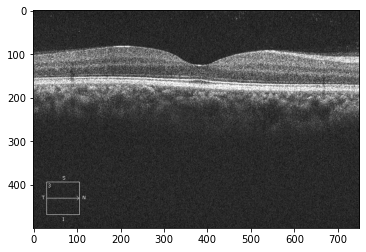

In [76]:
image_path = "OCTID_NORMAL"
image_name = "NORMAL31.jpeg"
image = os.path.join(image_path, image_name)

oct_image = imread(image)
plt.imshow(oct_image, cmap='gray')

# Taking the first of the 3 channels, as they are all the same.
X = oct_image[:,:,0]
plt.imshow(oct_image, cmap='gray')

## Vary The compression levels for our image

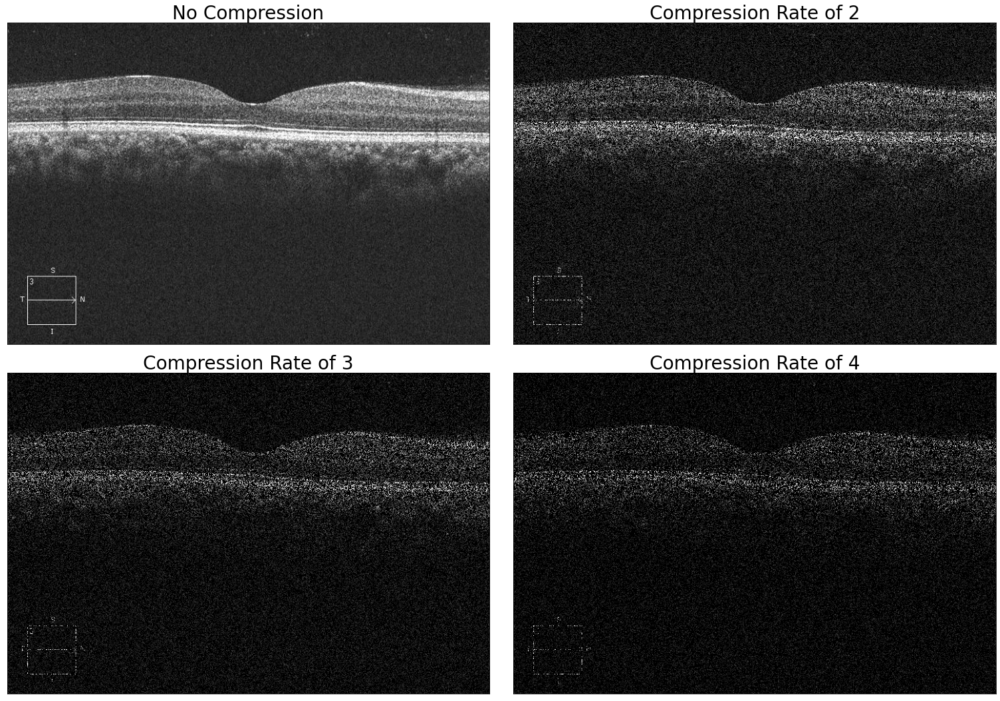

In [77]:
compression = [1, 2, 3, 4]
compressed_images = []
compression_masks = []
h, w = X.shape

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(21, 15.5))
for i, cmprsn_rate in enumerate(compression):
    mask = np.random.binomial(size=(h, w), n=1, p=1/cmprsn_rate)
    compressed_images.append(X*mask)
    compression_masks.append(mask)
    
    axes[i//2][i%2].set_aspect('equal')
    if i == 0:
        axes[i//2][i%2].set_title(f"No Compression", fontsize=28)
    else:
        axes[i//2][i%2].set_title(f"Compression Rate of {cmprsn_rate}", fontsize=28)
    axes[i//2][i%2].imshow(X*mask, cmap="gray")
    axes[i//2][i%2].set_xticks([])
    axes[i//2][i%2].set_yticks([])
    
    
    
fig.tight_layout()
fig.subplots_adjust(wspace=0.05, hspace=-0.05)

fig.set_facecolor('white')
plt.savefig("Compressed_Images.png", dpi=400)

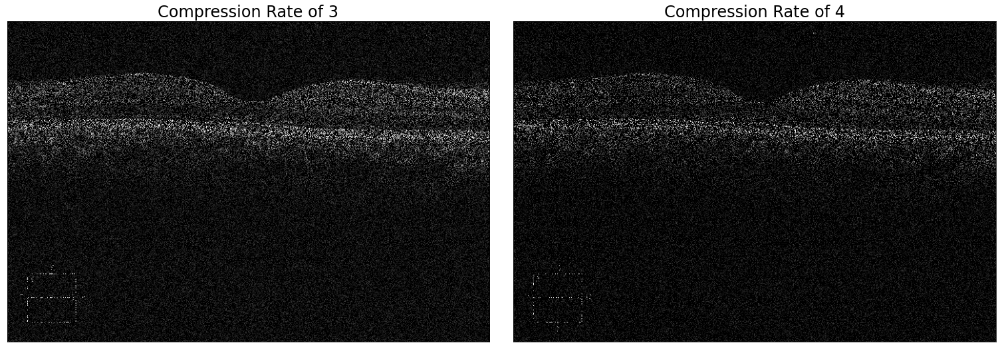

In [78]:
compression = [3, 4]
compressed_images = []
compression_masks = []
h, w = X.shape

fig, axes = plt.subplots(ncols=2, figsize=(21, 15.5))
for i, cmprsn_rate in enumerate(compression):
    mask = np.random.binomial(size=(h, w), n=1, p=1/cmprsn_rate)
    compressed_images.append(X*mask)
    compression_masks.append(mask)
    
    axes[i].set_aspect('equal')
    axes[i].set_title(f"Compression Rate of {cmprsn_rate}", fontsize=24)
    axes[i].imshow(X*mask, cmap="gray")
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    
    
    
fig.tight_layout()
fig.subplots_adjust(wspace=0.05, hspace=-0.1)

fig.set_facecolor('white')

# For each Compression Rate, run a rough Hyperparameter search for both Low-Rank and Sparsity minimization

# Set up our initial variables for the $\ell_{1}$ norm minimization problem

W is the variable that we are trying to optimize with repect to. W is used as the weights for our chosen basis vectors, and we seek to enforce that $\mathcal{P}_{\Omega}(B_{1} W B_{2}^{\mathbf{T}}) \approx \mathcal{P}_{\Omega}(X)$, and that we have either $\text{rank}(W) \leq k$m for some small value of $k$, or that $\lVert W \rVert_{0}$ is small, or both. (We want matrix $W$ to be sparse/lowrank). 

### set basis = 'dct' to use discrete cosine basis or to "wavelet" to use a wavelet basis.

In [13]:
basis_ = "dct"

if basis_ == "dct":
    B1 = dct(np.eye(h), norm='ortho', axis=0).T
    B2t = dct(np.eye(w), norm='ortho', axis=0)
else: 
    # pywt.dwt2 is the discrete wavelet transform in 2D. It returns the transformed array
    # in 4 equaly sized block matrices which are simplpy regions of the entire 2D transform
    (cA, (cH, cV, cD)) = dwt2(np.eye(h), 'db1')
    upper = np.concatenate([cA, cH])
    lower = np.concatenate([cV, cD])
    B1 = np.concatenate([upper, lower], axis=1)
    
    (cA, (cH, cV, cD)) = dwt2(np.eye(w), 'db1')
    upper = np.concatenate([cA, cH])
    lower = np.concatenate([cV, cD])
    B2t = np.concatenate([upper, lower], axis=1)


W_start = []
for D in compressed_images:
    W_start.append(np.linalg.inv(B1) @ D @ np.linalg.inv(B2t))

a = 1
tau = 1

# range of hyperparameters to weight the reconstruction loss against the sparsity loss
lbda_search_space = np.concatenate([np.array([0.25, 0.5]), np.arange(1, 10, 1)])

In [15]:
def Update1(mask, B1, B2t, W, D, a):
    # Minimize the error with respect to constraint P_{\Omega}(B1 @ W @ B2t) == P_{\Omega}
    Z = Proj(B1 @ W @ B2t, mask) - D
    Z = B1.T @ Z @ B2t.T
    return W - a*Z

In [84]:
[
    np.sum(results_low_rank_compresssion_3[name]['W'] == 0) / 
    np.sum(results_low_rank_compresssion_3[name]['W'] != None)
    for name in results_low_rank_compresssion_3.keys()
]

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [85]:
[
    np.sum(results_low_rank_compresssion_4[name]['W'] == 0) / 
    np.sum(results_low_rank_compresssion_4[name]['W'] != None)
    for name in results_low_rank_compresssion_4.keys()
]
# results_low_rank_compresssion_4
# results_sparse_compresssion_3
# results_sparse_compresssion_4

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0]

In [96]:
np.sum(results_sparse_compresssion_3[5]['W'] == 0) /  np.sum(results_sparse_compresssion_3[5]['W'] != None)

0.7701493333333334

In [103]:
np.sum(results_sparse_compresssion_4[7]['W'] == 0) /  np.sum(results_sparse_compresssion_4[7]['W'] != None)

0.86008

# Main loop in the Hyperparameter Search

### Start with Compression Ratio of 3

In [53]:
iters = 500

for lbda in (5 + np.arange(0, 150, 5)):
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[0]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[0], B1, B2t, W, compressed_images[0], a)
        W = ShrinkageOperator(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_low_rank_compresssion_3[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=5, compression 3
	Iteration 1:	Reconstruction Error: 31398.94	Spectral Norm W: 453127.65	Sparisty of W: 85995.48
	Iteration 51:	Reconstruction Error: 28882.06	Spectral Norm W: 377664.11	Sparisty of W: 86588.96
	Iteration 101:	Reconstruction Error: 26770.71	Spectral Norm W: 323158.87	Sparisty of W: 87234.36
	Iteration 151:	Reconstruction Error: 24966.95	Spectral Norm W: 285537.41	Sparisty of W: 88170.81
	Iteration 201:	Reconstruction Error: 23401.49	Spectral Norm W: 258286.53	Sparisty of W: 89371.91
	Iteration 251:	Reconstruction Error: 22031.13	Spectral Norm W: 237793.38	Sparisty of W: 90788.30
	Iteration 301:	Reconstruction Error: 20823.30	Spectral Norm W: 222059.87	Sparisty of W: 92352.54
	Iteration 351:	Reconstruction Error: 19751.69	Spectral Norm W: 209815.19	Sparisty of W: 94080.31
	Iteration 401:	Reconstruction Error: 18795.05	Spectral Norm W: 200161.10	Sparisty of W: 95944.37
	Iteration 451:	Reconstruction Error: 17936.01	Spectral Norm W: 192440.21

KeyboardInterrupt: 

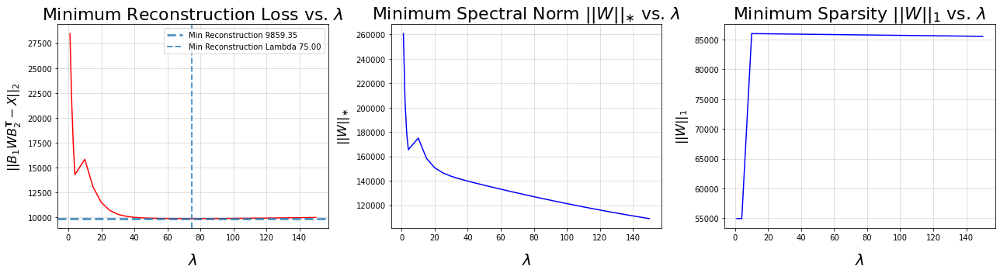

In [50]:
lambda_vals = np.concatenate([np.arange(1, 5, 1), np.arange(10, 155, 5)])

min_reconstruction = [min(results_low_rank_compresssion_3[l]['reconstruction']) for l in lambda_vals]
final_spectral = [min(results_low_rank_compresssion_3[l]['spectral']) for l in lambda_vals]
final_sparse = [min(results_low_rank_compresssion_3[l]['sparsity']) for l in lambda_vals]

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(lambda_vals, min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)

axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(lambda_vals, final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(lambda_vals, final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=22)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Low Rank, Compression Rate of 3", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
# plt.savefig("Low_rank_compression_3_hyperparam_plots.png", dpi=400)
plt.show()

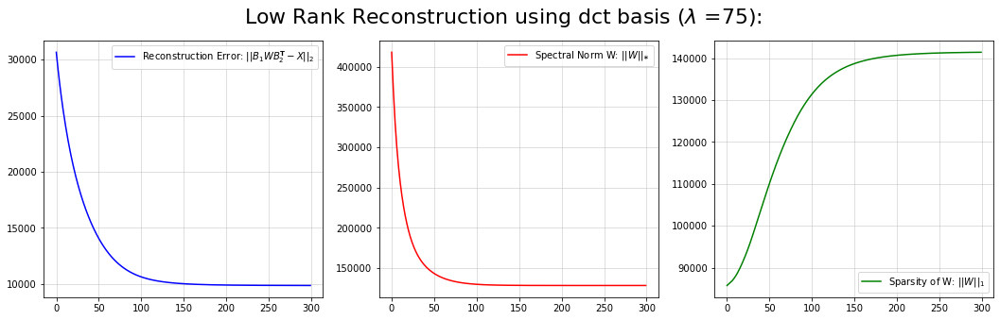

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

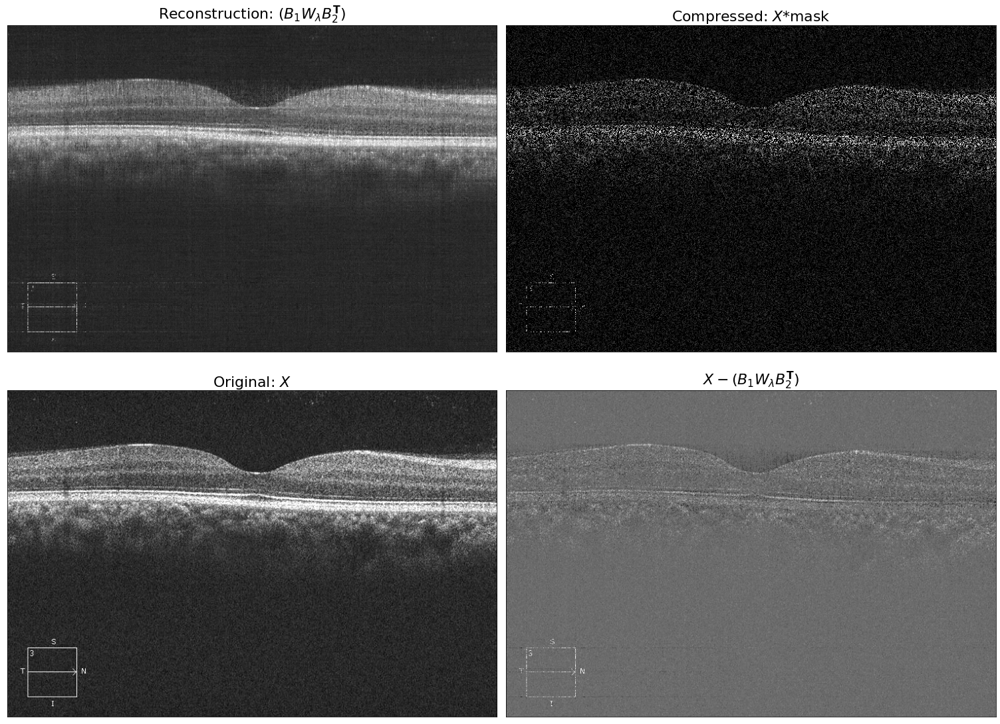

In [119]:
lbda_ = 75
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_low_rank_compresssion_3[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_low_rank_compresssion_3[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_low_rank_compresssion_3[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

fig.suptitle(f"Low Rank Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

fig.set_facecolor('white')
# plt.savefig("Low_rank_compression_3_lambda_9_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 16))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_low_rank_compresssion_3[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_low_rank_compresssion_3[lbda_]['W'] @ B2t), cmap="gray")

for ax in axes:
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
fig.subplots_adjust(wspace=0.05, hspace=-0.1)
plt.savefig(f"Low_rank_compression_3_lambda_{lbda_}_grid.png", dpi=400)
plt.tight_layout()
plt.show()

### Compression Rate of 4

In [63]:
iters = 500

for lbda in np.arange(5, 150, 5):
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[1]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[1]     
    for i in range(iters):
        W = Update1(compression_masks[1], B1, B2t, W, compressed_images[1], a)
        W = ShrinkageOperator(W, lbda)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_low_rank_compresssion_4[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=5, compression 4
	Iteration 1:	Reconstruction Error: 35186.53	Spectral Norm W: 440074.39	Sparisty of W: 69782.60
	Iteration 51:	Reconstruction Error: 32968.53	Spectral Norm W: 366850.74	Sparisty of W: 70495.19
	Iteration 101:	Reconstruction Error: 31106.03	Spectral Norm W: 316080.30	Sparisty of W: 71355.20
	Iteration 151:	Reconstruction Error: 29491.15	Spectral Norm W: 281555.60	Sparisty of W: 72434.58
	Iteration 201:	Reconstruction Error: 28058.38	Spectral Norm W: 256312.68	Sparisty of W: 73705.32
	Iteration 251:	Reconstruction Error: 26771.55	Spectral Norm W: 236906.11	Sparisty of W: 75129.45
	Iteration 301:	Reconstruction Error: 25606.79	Spectral Norm W: 221544.53	Sparisty of W: 76689.51
	Iteration 351:	Reconstruction Error: 24546.68	Spectral Norm W: 209170.50	Sparisty of W: 78336.39
	Iteration 401:	Reconstruction Error: 23577.30	Spectral Norm W: 199082.17	Sparisty of W: 80080.54
	Iteration 451:	Reconstruction Error: 22686.91	Spectral Norm W: 190771.53

Starting Optimizer with lambda=45, compression 4
	Iteration 1:	Reconstruction Error: 34808.73	Spectral Norm W: 420074.39	Sparisty of W: 69650.36
	Iteration 51:	Reconstruction Error: 22529.90	Spectral Norm W: 176968.90	Sparisty of W: 81732.75
	Iteration 101:	Reconstruction Error: 16919.87	Spectral Norm W: 141520.74	Sparisty of W: 99254.81
	Iteration 151:	Reconstruction Error: 13921.08	Spectral Norm W: 130133.02	Sparisty of W: 114954.04
	Iteration 201:	Reconstruction Error: 12428.75	Spectral Norm W: 125825.21	Sparisty of W: 126368.23
	Iteration 251:	Reconstruction Error: 11742.82	Spectral Norm W: 124280.57	Sparisty of W: 133353.06
	Iteration 301:	Reconstruction Error: 11430.63	Spectral Norm W: 123754.91	Sparisty of W: 137263.24
	Iteration 351:	Reconstruction Error: 11281.68	Spectral Norm W: 123576.60	Sparisty of W: 139433.93
	Iteration 401:	Reconstruction Error: 11205.98	Spectral Norm W: 123514.64	Sparisty of W: 140664.20
	Iteration 451:	Reconstruction Error: 11165.24	Spectral Norm W: 12

Starting Optimizer with lambda=85, compression 4
	Iteration 1:	Reconstruction Error: 34450.02	Spectral Norm W: 400074.39	Sparisty of W: 69518.19
	Iteration 51:	Reconstruction Error: 17289.45	Spectral Norm W: 132047.37	Sparisty of W: 97102.41
	Iteration 101:	Reconstruction Error: 12602.65	Spectral Norm W: 114983.31	Sparisty of W: 124345.27
	Iteration 151:	Reconstruction Error: 11466.11	Spectral Norm W: 112482.16	Sparisty of W: 136312.38
	Iteration 201:	Reconstruction Error: 11201.77	Spectral Norm W: 112170.76	Sparisty of W: 140209.90
	Iteration 251:	Reconstruction Error: 11126.77	Spectral Norm W: 112128.78	Sparisty of W: 141480.76
	Iteration 301:	Reconstruction Error: 11101.72	Spectral Norm W: 112122.20	Sparisty of W: 141917.61
	Iteration 351:	Reconstruction Error: 11092.53	Spectral Norm W: 112120.97	Sparisty of W: 142077.70
	Iteration 401:	Reconstruction Error: 11088.97	Spectral Norm W: 112120.70	Sparisty of W: 142139.10
	Iteration 451:	Reconstruction Error: 11087.54	Spectral Norm W: 1

Starting Optimizer with lambda=125, compression 4
	Iteration 1:	Reconstruction Error: 34110.99	Spectral Norm W: 380074.39	Sparisty of W: 69386.05
	Iteration 51:	Reconstruction Error: 14300.70	Spectral Norm W: 110567.66	Sparisty of W: 111769.47
	Iteration 101:	Reconstruction Error: 11497.30	Spectral Norm W: 102835.51	Sparisty of W: 136070.63
	Iteration 151:	Reconstruction Error: 11176.39	Spectral Norm W: 102470.04	Sparisty of W: 140916.13
	Iteration 201:	Reconstruction Error: 11123.93	Spectral Norm W: 102450.26	Sparisty of W: 141816.04
	Iteration 251:	Reconstruction Error: 11112.74	Spectral Norm W: 102448.49	Sparisty of W: 142006.61
	Iteration 301:	Reconstruction Error: 11110.05	Spectral Norm W: 102448.22	Sparisty of W: 142051.75
	Iteration 351:	Reconstruction Error: 11109.36	Spectral Norm W: 102448.15	Sparisty of W: 142063.18
	Iteration 401:	Reconstruction Error: 11109.17	Spectral Norm W: 102448.14	Sparisty of W: 142066.23
	Iteration 451:	Reconstruction Error: 11109.12	Spectral Norm W:

In [108]:
results_low_rank_compresssion_4.keys()

dict_keys([1, 6, 11, 16, 21, 26, 31, 36, 41, 46, 51, 56, 61, 66, 71, 76, 81, 86, 91, 96, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95])

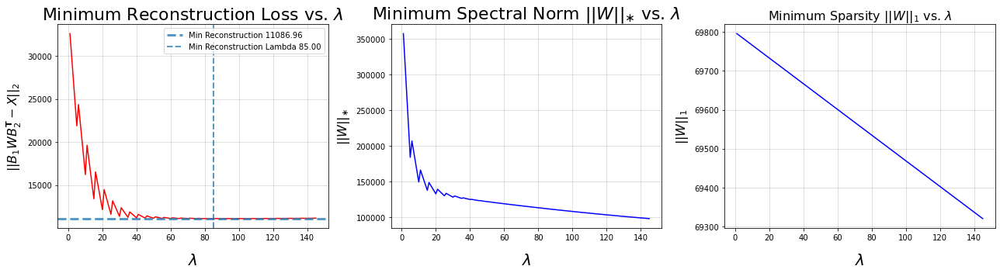

In [111]:
lmbda_vals = sorted(results_low_rank_compresssion_4.keys())

min_reconstruction = [min(results_low_rank_compresssion_4[l]['reconstruction']) for l in lmbda_vals]
final_spectral = [min(results_low_rank_compresssion_4[l]['spectral']) for l in lmbda_vals]
final_sparse = [min(results_low_rank_compresssion_4[l]['sparsity']) for l in lmbda_vals]

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(lmbda_vals, min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lmbda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lmbda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)

axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(lmbda_vals, final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(lmbda_vals, final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Low Rank, Compression Rate of 4", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
# plt.savefig("Low_rank_compression_4_hyperparam_plots.png", dpi=400)
plt.show()

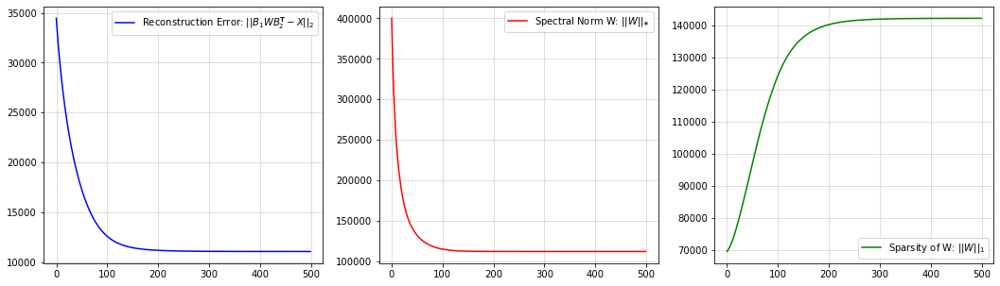

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

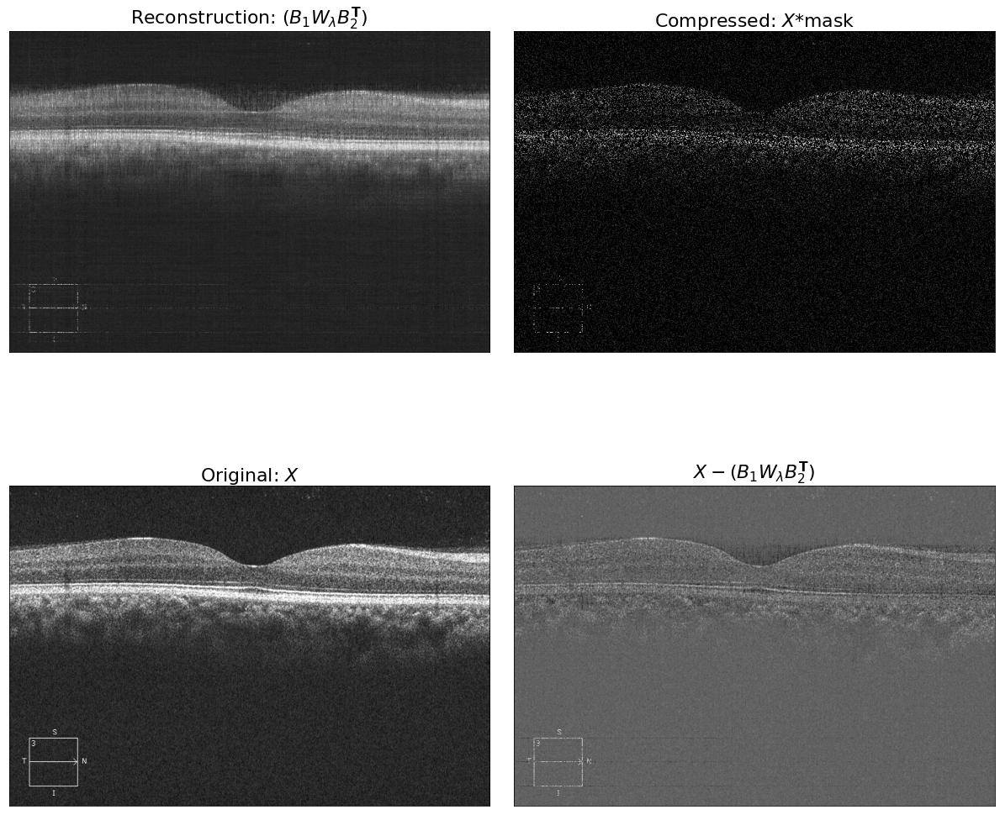

In [118]:
lbda_ = 85
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_low_rank_compresssion_4[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_low_rank_compresssion_4[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_low_rank_compresssion_4[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

# fig.suptitle(f"Low Rank Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

fig.set_facecolor('white')
plt.savefig(f"Low_rank_compression_4_lambda_{lbda_}_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_low_rank_compresssion_4[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[1], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_low_rank_compresssion_4[lbda_]['W'] @ B2t), cmap="gray")

for ax in axes:
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
fig.subplots_adjust(wspace=0.05, hspace=-0.1)

fig.set_facecolor('white')
plt.savefig(f"Low_rank_compression_4_lambda_{lbda_}_grid.png", dpi=400)
plt.show()

In [90]:
iters = 750

for lbda in lbda_search_space:
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[0]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[0], B1, B2t, W, compressed_images[0], a)
        W = SoftThresh(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_sparse_compresssion_3[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 3
	Iteration 1:	Reconstruction Error: 31286.30	Spectral Norm W: 453859.83	Sparisty of W: 85173.63
	Iteration 51:	Reconstruction Error: 27579.60	Spectral Norm W: 394730.74	Sparisty of W: 86688.90
	Iteration 101:	Reconstruction Error: 24513.63	Spectral Norm W: 353935.11	Sparisty of W: 89694.97
	Iteration 151:	Reconstruction Error: 21943.95	Spectral Norm W: 324209.20	Sparisty of W: 93305.47
	Iteration 201:	Reconstruction Error: 19771.16	Spectral Norm W: 301340.04	Sparisty of W: 97112.57
	Iteration 251:	Reconstruction Error: 17932.48	Spectral Norm W: 283082.23	Sparisty of W: 100843.05
	Iteration 301:	Reconstruction Error: 16384.57	Spectral Norm W: 268274.12	Sparisty of W: 104306.35
	Iteration 351:	Reconstruction Error: 15089.69	Spectral Norm W: 256224.64	Sparisty of W: 107494.88
	Iteration 401:	Reconstruction Error: 14016.52	Spectral Norm W: 246437.37	Sparisty of W: 110457.55
	Iteration 451:	Reconstruction Error: 13137.58	Spectral Norm W: 23

	Iteration 301:	Reconstruction Error: 9562.32	Spectral Norm W: 191731.01	Sparisty of W: 131038.78
	Iteration 351:	Reconstruction Error: 9563.30	Spectral Norm W: 191772.94	Sparisty of W: 131052.79
	Iteration 401:	Reconstruction Error: 9563.78	Spectral Norm W: 191793.28	Sparisty of W: 131059.63
	Iteration 451:	Reconstruction Error: 9564.03	Spectral Norm W: 191803.64	Sparisty of W: 131063.13
	Iteration 501:	Reconstruction Error: 9564.16	Spectral Norm W: 191809.10	Sparisty of W: 131064.98
	Iteration 551:	Reconstruction Error: 9564.24	Spectral Norm W: 191812.05	Sparisty of W: 131065.98
	Iteration 601:	Reconstruction Error: 9564.28	Spectral Norm W: 191813.67	Sparisty of W: 131066.53
	Iteration 651:	Reconstruction Error: 9564.30	Spectral Norm W: 191814.58	Sparisty of W: 131066.84
	Iteration 701:	Reconstruction Error: 9564.32	Spectral Norm W: 191815.10	Sparisty of W: 131067.02
Starting Optimizer with lambda=5.0, compression 3
	Iteration 1:	Reconstruction Error: 29836.34	Spectral Norm W: 415082

	Iteration 651:	Reconstruction Error: 9652.37	Spectral Norm W: 157163.98	Sparisty of W: 128576.42
	Iteration 701:	Reconstruction Error: 9652.37	Spectral Norm W: 157163.98	Sparisty of W: 128576.42


In [72]:
[np.sum(results_sparse_compresssion_4[name]['W'] == 0) / np.sum(results_sparse_compresssion_4[name]['W'] != None) for name in results_sparse_compresssion_4.keys()]

[]

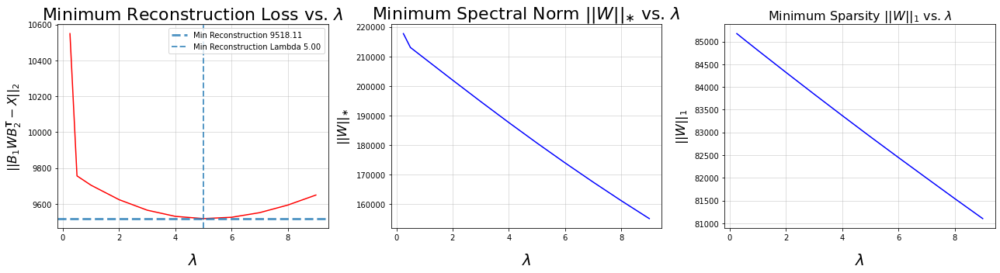

In [94]:
min_reconstruction = [min(results_sparse_compresssion_3[l]['reconstruction']) for l in results_sparse_compresssion_3.keys()]
final_spectral = [min(results_sparse_compresssion_3[l]['spectral']) for l in results_sparse_compresssion_3.keys()]
final_sparse = [min(results_sparse_compresssion_3[l]['sparsity']) for l in results_sparse_compresssion_3.keys()]
lambda_vals = list(results_sparse_compresssion_3.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_sparse_compresssion_3.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)
axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_sparse_compresssion_3.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_sparse_compresssion_3.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Sparse, Compression Rate of 3", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
# plt.savefig("sparse_compression_3_hyperparam_plots.png", dpi=400)
plt.show()

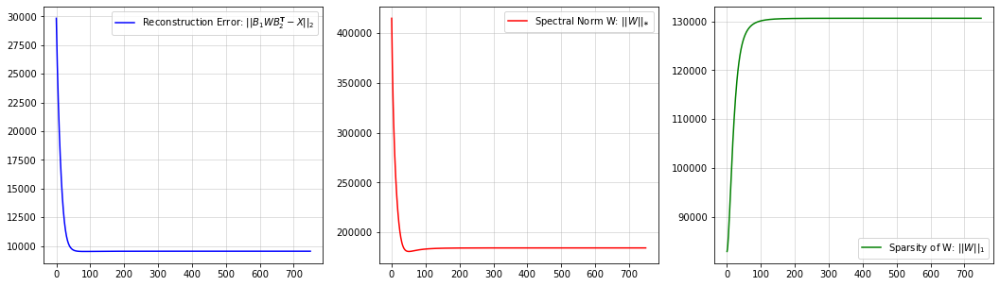

Resulting Reconstruction:


<Figure size 1008x648 with 0 Axes>

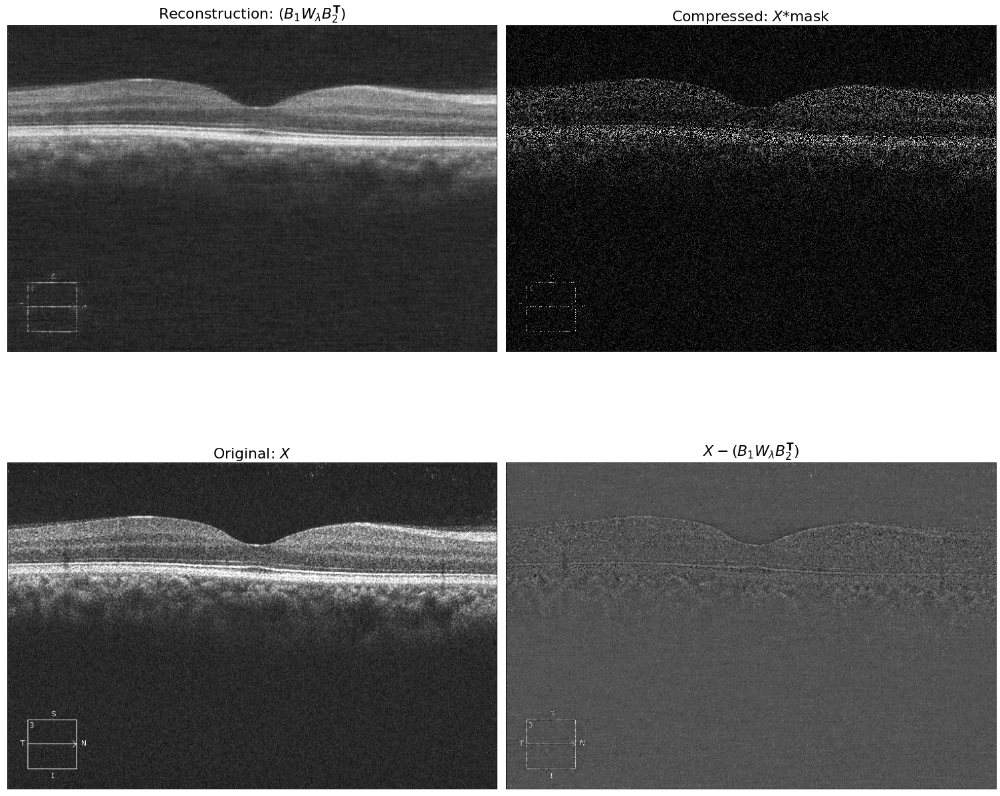

In [122]:
lbda_ = 5
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_sparse_compresssion_3[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_sparse_compresssion_3[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_sparse_compresssion_3[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

# fig.suptitle(f"Sparse Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)
fig.set_facecolor('white')
plt.savefig(f"sparse_compression_3_lambda_{lbda_}_plots.png", dpi=400)
plt.show();

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_sparse_compresssion_3[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_sparse_compresssion_3[lbda_]['W'] @ B2t), cmap="gray")

for ax in axes:
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
fig.subplots_adjust(wspace=0.05, hspace=-0.1)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig(f"sparse_compression_3_lambda_{lbda_}_grid.png", dpi=400)
plt.show()

In [91]:
iters = 750

for lbda in lbda_search_space:
    print(f"Starting Optimizer with lambda={lbda}, compression {compression[1]}")
    reconstruction_error = []
    spectral_norm = []
    sparsity = []
    
    # reset the initial W 
    W = W_start[0]
    for i in range(iters):
        W = Update1(compression_masks[1], B1, B2t, W, compressed_images[1], a)
        W = SoftThresh(W, lbda*tau)

        spectral_norm.append(np.linalg.norm(W, ord="nuc"))
        sparsity.append(np.linalg.norm(W, ord=1))
        reconstruction_error.append(np.linalg.norm(X - B1 @ W @ B2t))
        if i % 50 == 0:
            print(
                f"\tIteration {i+1}:\t"\
                f"Reconstruction Error: {reconstruction_error[-1]:.2f}\t"\
                f"Spectral Norm W: {spectral_norm[-1]:.2f}\t"\
                f"Sparisty of W: {sparsity[-1]:.2f}"
            )
            
    results_sparse_compresssion_4[lbda] = {
        'spectral': spectral_norm,
        'sparsity': sparsity,
        'reconstruction': reconstruction_error,
        'W': W
    }

Starting Optimizer with lambda=0.25, compression 4
	Iteration 1:	Reconstruction Error: 33261.15	Spectral Norm W: 449776.10	Sparisty of W: 78314.85
	Iteration 51:	Reconstruction Error: 29788.70	Spectral Norm W: 388486.38	Sparisty of W: 78955.69
	Iteration 101:	Reconstruction Error: 26979.07	Spectral Norm W: 348319.51	Sparisty of W: 81170.20
	Iteration 151:	Reconstruction Error: 24647.82	Spectral Norm W: 320941.35	Sparisty of W: 84219.37
	Iteration 201:	Reconstruction Error: 22668.55	Spectral Norm W: 300876.04	Sparisty of W: 87524.69
	Iteration 251:	Reconstruction Error: 20961.34	Spectral Norm W: 285232.74	Sparisty of W: 90945.32
	Iteration 301:	Reconstruction Error: 19478.40	Spectral Norm W: 272486.68	Sparisty of W: 94184.30
	Iteration 351:	Reconstruction Error: 18187.88	Spectral Norm W: 261822.25	Sparisty of W: 97238.29
	Iteration 401:	Reconstruction Error: 17067.18	Spectral Norm W: 252816.71	Sparisty of W: 100062.42
	Iteration 451:	Reconstruction Error: 16098.83	Spectral Norm W: 24514

	Iteration 301:	Reconstruction Error: 10486.45	Spectral Norm W: 186665.70	Sparisty of W: 126863.07
	Iteration 351:	Reconstruction Error: 10488.77	Spectral Norm W: 186788.79	Sparisty of W: 126900.57
	Iteration 401:	Reconstruction Error: 10490.07	Spectral Norm W: 186856.80	Sparisty of W: 126919.20
	Iteration 451:	Reconstruction Error: 10490.83	Spectral Norm W: 186895.78	Sparisty of W: 126929.01
	Iteration 501:	Reconstruction Error: 10491.28	Spectral Norm W: 186918.57	Sparisty of W: 126934.37
	Iteration 551:	Reconstruction Error: 10491.54	Spectral Norm W: 186932.15	Sparisty of W: 126937.43
	Iteration 601:	Reconstruction Error: 10491.70	Spectral Norm W: 186940.42	Sparisty of W: 126939.22
	Iteration 651:	Reconstruction Error: 10491.79	Spectral Norm W: 186945.55	Sparisty of W: 126940.30
	Iteration 701:	Reconstruction Error: 10491.85	Spectral Norm W: 186948.77	Sparisty of W: 126940.96
Starting Optimizer with lambda=5.0, compression 4
	Iteration 1:	Reconstruction Error: 31887.10	Spectral Norm 

	Iteration 601:	Reconstruction Error: 10437.30	Spectral Norm W: 151069.12	Sparisty of W: 124931.09
	Iteration 651:	Reconstruction Error: 10437.30	Spectral Norm W: 151069.12	Sparisty of W: 124931.09
	Iteration 701:	Reconstruction Error: 10437.30	Spectral Norm W: 151069.12	Sparisty of W: 124931.09


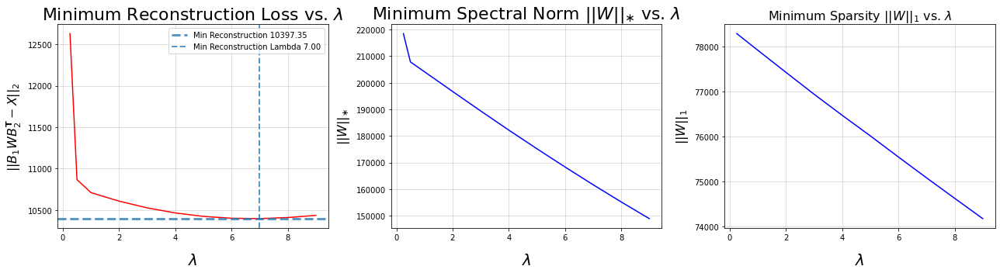

In [100]:
min_reconstruction = [min(results_sparse_compresssion_4[l]['reconstruction']) for l in results_sparse_compresssion_4.keys()]
final_spectral = [min(results_sparse_compresssion_4[l]['spectral']) for l in results_sparse_compresssion_4.keys()]
final_sparse = [min(results_sparse_compresssion_4[l]['sparsity']) for l in results_sparse_compresssion_4.keys()]
lambda_vals = list(results_sparse_compresssion_4.keys())

fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(list(results_sparse_compresssion_4.keys()), min_reconstruction, c='r')
axes[0].axhline(min(min_reconstruction), label=f"Min Reconstruction {min(min_reconstruction):.2f}",ls='--', alpha=0.75, lw=3)
axes[0].axvline(
    lambda_vals[np.argmin(min_reconstruction)],
    label=f"Min Reconstruction Lambda {lambda_vals[np.argmin(min_reconstruction)]:.2f}",
    ls='--', alpha=0.75, lw=2
)
axes[0].set_title(r"Minimum Reconstruction Loss vs. $\lambda$", fontsize=22)
axes[0].set_ylabel(r"$||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$", fontsize=16, labelpad=5)
axes[0].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[0].grid(alpha=0.5)
axes[0].legend()

axes[1].plot(list(results_sparse_compresssion_4.keys()), final_spectral, c='b')
axes[1].set_title(r"Minimum Spectral Norm $||W||_{\ast}$ vs. $\lambda$", fontsize=22)
axes[1].set_ylabel(r"$||W||_{\ast}$", fontsize=16, labelpad=5)
axes[1].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[1].grid(alpha=0.5)

axes[2].plot(list(results_sparse_compresssion_4.keys()), final_sparse, c='b')
axes[2].set_title(r"Minimum Sparsity $||W||_{1}$ vs. $\lambda$", fontsize=16)
axes[2].set_ylabel(r"$||W||_{1}$", fontsize=16, labelpad=5)
axes[2].set_xlabel(r"$\lambda$", fontsize=20, labelpad=15)
axes[2].grid(alpha=0.5)

# fig.suptitle(r"Sparse, Compression Rate of 4", y=1.06, fontsize=24)

plt.tight_layout()
fig.set_facecolor('white')
# plt.savefig("sparse_compression_4_hyperparam_plots.png", dpi=400)
plt.show()

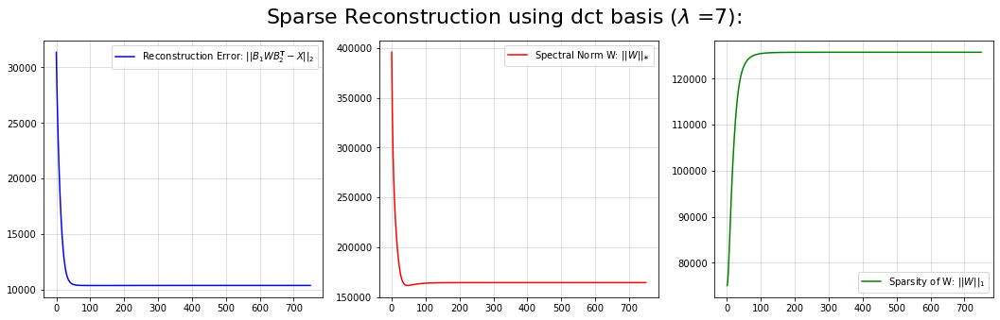

Resulting Reconstruction:


<Figure size 432x288 with 0 Axes>

<Figure size 1008x648 with 0 Axes>

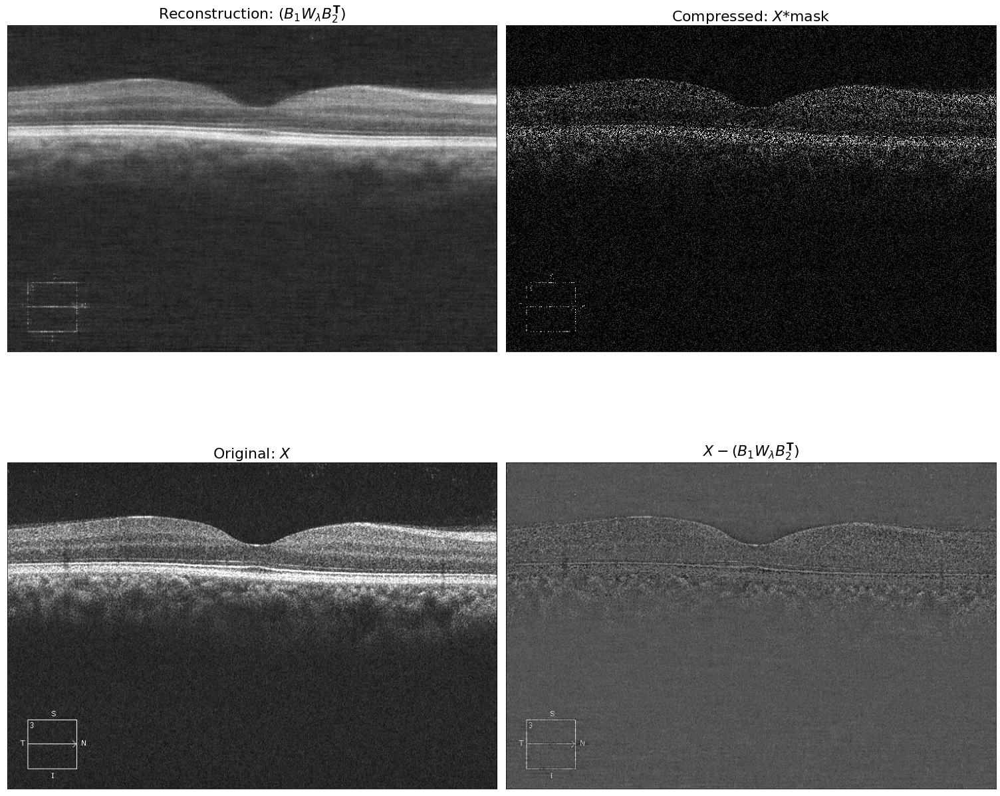

In [121]:
lbda_ = 7
fig, axes = plt.subplots(ncols=3, figsize=(18, 5))

axes[0].plot(results_sparse_compresssion_4[lbda_]['reconstruction'], c='b', label=r"Reconstruction Error: $||B_{1} W B_{2}^{\mathbf{T}} - X ||_{2}$")
axes[1].plot(results_sparse_compresssion_4[lbda_]['spectral'], c='r', label=r"Spectral Norm W: $|| W ||_{\ast}$")
axes[2].plot(results_sparse_compresssion_4[lbda_]['sparsity'], c='g', label=r"Sparsity of W: $|| W ||_{1}$")

axes[0].legend()
axes[1].legend()
axes[2].legend()

axes[0].grid(alpha=0.5)
axes[1].grid(alpha=0.5)
axes[2].grid(alpha=0.5)

fig.suptitle(f"Sparse Reconstruction using {basis_} basis " + r"($\lambda$ =" + f"{lbda_}):", fontsize=22)

plt.show();
fig.set_facecolor('white')
plt.savefig(f"sparse_compression_4_lambda_{lbda_}_plots.png", dpi=400)

print(f"Resulting Reconstruction:")
plt.figure(figsize=(14, 9));
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(21, 21))

axes[0][0].set_title(r"Reconstruction: $(B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[0][0].imshow(B1 @ results_sparse_compresssion_4[lbda_]['W'] @ B2t, cmap="gray")

axes[0][1].set_title(r"Compressed: $X$*mask", fontsize=22)
axes[0][1].imshow(X*compression_masks[0], cmap="gray")

axes[1][0].set_title(r"Original: $X$", fontsize=22)
axes[1][0].imshow(X, cmap="gray")

axes[1][1].set_title(r"$X - (B_{1} W_{\lambda} B_{2}^{\mathbf{T}}$)", fontsize=22)
axes[1][1].imshow(X - (B1 @ results_sparse_compresssion_4[lbda_]['W'] @ B2t), cmap="gray")

for ax in axes:
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
fig.subplots_adjust(wspace=0.05, hspace=-0.1)

plt.tight_layout()
fig.set_facecolor('white')
plt.savefig(f"sparse_compression_4_lambda_{lbda_}_grid.png", dpi=400)
plt.show()